<a href="https://colab.research.google.com/github/graviraja/100-Days-of-NLP/blob/applications%2Fgeneration/applications/generation/image_captioning/Image%20Captioning%20with%20BPE%20Tokenization.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### Flickr8k Dataset

In [8]:
from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"ravirajag","key":"1e173d956dd413c1be238cb748832358"}'}

In [2]:
!mkdir ~/.kaggle

In [9]:
!cp kaggle.json ~/.kaggle

In [10]:
!chmod 600 ~/.kaggle/kaggle.json

In [11]:
!kaggle datasets download -d adityajn105/flickr8k

 98% 1.01G/1.04G [00:16<00:00, 53.9MB/s]
100% 1.04G/1.04G [00:16<00:00, 68.0MB/s]


In [12]:
!unzip -qq flickr8k.zip -d flickr8k

In [13]:
!ls flickr8k

captions.txt  Images


In [14]:
!pip install youtokentome

     |████████████████████████████████| 1.7MB 8.0MB/s 


### Karapathy's Split

We will use [Andrej Karpathy's training, validation, and test splits](http://cs.stanford.edu/people/karpathy/deepimagesent/caption_datasets.zip). This zip file contain the captions

In [15]:
from google.colab import files
files.upload()

Saving dataset_flickr8k.json to dataset_flickr8k.json


{'dataset_flickr8k.json': b'{"images": [{"sentids": [0, 1, 2, 3, 4], "imgid": 0, "sentences": [{"tokens": ["a", "black", "dog", "is", "running", "after", "a", "white", "dog", "in", "the", "snow"], "raw": "A black dog is running after a white dog in the snow .", "imgid": 0, "sentid": 0}, {"tokens": ["black", "dog", "chasing", "brown", "dog", "through", "snow"], "raw": "Black dog chasing brown dog through snow", "imgid": 0, "sentid": 1}, {"tokens": ["two", "dogs", "chase", "each", "other", "across", "the", "snowy", "ground"], "raw": "Two dogs chase each other across the snowy ground .", "imgid": 0, "sentid": 2}, {"tokens": ["two", "dogs", "play", "together", "in", "the", "snow"], "raw": "Two dogs play together in the snow .", "imgid": 0, "sentid": 3}, {"tokens": ["two", "dogs", "running", "through", "a", "low", "lying", "body", "of", "water"], "raw": "Two dogs running through a low lying body of water .", "imgid": 0, "sentid": 4}], "split": "train", "filename": "2513260012_03d33305cf.jpg

In [16]:
karapathy_json_path = "dataset_flickr8k.json"
image_dir = "flickr8k/Images"
processed_image_dir = "processed_images"

### Imports

In [42]:
import os
import time
import json
import pickle
import random
import codecs

import numpy as np
import youtokentome

from PIL import Image
from collections import Counter

import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision.models as models
import torchvision.transforms as transforms
import torch.utils.data as data

from torch.nn.utils.rnn import pack_padded_sequence
from sklearn.model_selection import train_test_split

import matplotlib.pyplot as plt
import matplotlib.cm as cm
import skimage.transform

In [18]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device

device(type='cuda')

### Image Processing

In [19]:
size = [256, 256]

In [20]:
def resize_image(image, size):
    return image.resize(size, Image.ANTIALIAS)

def resize_images(image_dir, output_dir, size):
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)
    
    images = os.listdir(image_dir)
    num_images = len(images)
    for i, image in enumerate(images):
        with open(os.path.join(image_dir, image), 'r+b') as f:
            with Image.open(f) as img:
                img = resize_image(img, size)
                img.save(os.path.join(output_dir, image), img.format)
        if (i+1) % 1000 == 0:
            print (f"[{i+1}/{num_images}] Resized the images and saved into '{output_dir}'.")
    

In [21]:
resize_images(image_dir, processed_image_dir, size)

[1000/8091] Resized the images and saved into 'processed_images'.
[2000/8091] Resized the images and saved into 'processed_images'.
[3000/8091] Resized the images and saved into 'processed_images'.
[4000/8091] Resized the images and saved into 'processed_images'.
[5000/8091] Resized the images and saved into 'processed_images'.
[6000/8091] Resized the images and saved into 'processed_images'.
[7000/8091] Resized the images and saved into 'processed_images'.
[8000/8091] Resized the images and saved into 'processed_images'.


### Train, Val, Test splits using Karapathy's file

In [41]:
with open(karapathy_json_path, 'r') as f:
    k_data = json.load(f)

In [44]:
train_image_paths = []
train_image_captions = []
val_image_paths = []
val_image_captions = []
test_image_paths = []
test_image_captions = []
num_captions_per_image = 5

In [45]:
for img in k_data['images']:
    captions = []

    # get the captions of the image
    for c in img['sentences']:
        # considering the raw caption instead of tokens, since we will be using BPE for tokenization
        captions.append(c['raw'])
    if len(captions) == 0:
        continue
    assert len(captions) == num_captions_per_image

    # image path
    path = os.path.join(processed_image_dir, img['filename'])

    # train, val, test split
    if img['split'] in {'train', 'restval'}:
        train_image_paths.extend([path] * num_captions_per_image)
        train_image_captions.extend(captions)
    elif img['split'] in {'val'}:
        val_image_paths.extend([path] * num_captions_per_image)
        val_image_captions.extend(captions)
    elif img['split'] in {'test'}:
        test_image_paths.extend([path] * num_captions_per_image)
        test_image_captions.extend(captions)
    
assert len(train_image_paths) == len(train_image_captions)
assert len(val_image_paths) == len(val_image_captions)
assert len(test_image_paths) == len(test_image_captions)

print(len(train_image_paths), len(val_image_paths), len(test_image_captions))

30000 5000 5000


In [46]:
with codecs.open("only_captions.txt", "w", encoding="utf-8") as f:
    f.write("\n".join(train_image_captions))

### Tokenizer

In [47]:
print("Learning BPE...")
youtokentome.BPE.train(data="only_captions.txt", vocab_size=3000, model="bpe.model")

Learning BPE...


In [48]:
print("Loading BPE model....")
bpe_model = youtokentome.BPE(model="bpe.model")

Loading BPE model....


In [49]:
# Special Tokens
print(f"<BOS>: {bpe_model.subword_to_id('<BOS>')}")
print(f"<EOS>: {bpe_model.subword_to_id('<EOS>')}")
print(f"<UNK>: {bpe_model.subword_to_id('<UNK>')}")
print(f"<PAD>: {bpe_model.subword_to_id('<PAD>')}")

<BOS>: 2
<EOS>: 3
<UNK>: 1
<PAD>: 0


In [50]:
pad_index = bpe_model.subword_to_id('<PAD>')

In [51]:
sentence = "This is a sample sentence"
encoded_ids = bpe_model.encode(sentence.lower(), output_type=youtokentome.OutputType.ID, bos=True, eos=True)
encoded_text = bpe_model.encode(sentence.lower(), output_type=youtokentome.OutputType.SUBWORD, bos=True, eos=True)
decoded_text = bpe_model.decode(encoded_ids, ignore_ids=[2, 3])

print(encoded_ids)
print(encoded_text)
print(decoded_text)

[2, 2749, 117, 80, 85, 213, 173, 85, 393, 128, 198, 3]
['<BOS>', '▁this', '▁is', '▁a', '▁s', 'am', 'ple', '▁s', 'ent', 'en', 'ce', '<EOS>']
['this is a sample sentence']


In [52]:
def bpe_tokenizer(sentence):
    encoded_ids = bpe_model.encode(sentence.lower(), output_type=youtokentome.OutputType.ID, bos=True, eos=True)
    return encoded_ids

In [53]:
bpe_tokenizer("This is a sample sentence")

[2, 2749, 117, 80, 85, 213, 173, 85, 393, 128, 198, 3]

### Caption Dataset

In [54]:
class CaptionDataset(data.Dataset):
    def __init__(self, image_paths, annotations, tokenizer, transform=None):
        self.image_paths = image_paths
        self.annotations = annotations
        self.tokenizer = tokenizer
        self.transform = transform
    
    def __len__(self):
        return len(self.annotations)
    
    def __getitem__(self, item):
        image_path = self.image_paths[item]
        caption = self.annotations[item]

        image = Image.open(image_path).convert('RGB')
        if self.transform is not None:
            image = self.transform(image)
                
        tokenized_caption = self.tokenizer(str(caption))
        caption = torch.Tensor(tokenized_caption)

        return image, caption

In [55]:
# Image preprocessing, normalization for the pretrained resnet
crop_size = 224
transform = transforms.Compose([ 
    transforms.RandomCrop(crop_size),
    transforms.RandomHorizontalFlip(), 
    transforms.ToTensor(), 
    transforms.Normalize((0.485, 0.456, 0.406), 
                            (0.229, 0.224, 0.225))])

In [58]:
train_caption_dataset = CaptionDataset(train_image_paths, train_image_captions, bpe_tokenizer, transform)
valid_caption_dataset = CaptionDataset(val_image_paths, val_image_captions, bpe_tokenizer, transform)
test_caption_dataset = CaptionDataset(test_image_paths, test_image_captions, bpe_tokenizer, transform)

### DataLoader

In [59]:
def collate_fn(data):
    data.sort(key=lambda x: len(x[1]), reverse=True)
    images, captions = zip(*data)

    # Merge images (from tuple of 3D tensor to 4D tensor).
    images = torch.stack(images, 0)

    # Merge captions (from tuple of 1D tensor to 2D tensor).
    lengths = [len(cap) for cap in captions]
    targets = torch.zeros(len(captions), max(lengths)).long()
    for i, cap in enumerate(captions):
        end = lengths[i]
        targets[i, :end] = cap[:end]        
    return images, targets, lengths

In [60]:
train_data_loader = torch.utils.data.DataLoader(
    dataset=train_caption_dataset, 
    batch_size=32,
    shuffle=True,
    num_workers=2,
    collate_fn=collate_fn)

valid_data_loader = torch.utils.data.DataLoader(
    dataset=valid_caption_dataset, 
    batch_size=16,
    shuffle=False,
    collate_fn=collate_fn)

test_data_loader = torch.utils.data.DataLoader(
    dataset=test_caption_dataset, 
    batch_size=16,
    shuffle=False,
    collate_fn=collate_fn)

In [61]:
sample = next(iter(train_data_loader))
sample[0].shape, sample[1].shape, len(sample[2])

(torch.Size([32, 3, 224, 224]), torch.Size([32, 25]), 32)

### Encoder

In [62]:
class Encoder(nn.Module):
    def __init__(self, encoded_image_size=14):
        super().__init__()

        resnet = models.resnet152(pretrained=True)

        # remove the linear and pooling layers
        modules = list(resnet.children())[:-2]
        self.resnet = nn.Sequential(*modules)

        self.adaptive_pool = nn.AdaptiveAvgPool2d((encoded_image_size, encoded_image_size))

    
    def forward(self, images):
        # images => [batch_size, 3, 224, 224]
        with torch.no_grad():
            features = self.resnet(images)
            # features => [batch_size, 2048, 7, 7]
        
        pooled = self.adaptive_pool(features)
        # pooled => [batch_size, 2048, encoded_img_size, encoded_img_size]
        #        => [batch_size, 2048, 14, 14]

        out = pooled.permute(0, 2, 3, 1)
        # out => [batch_size, 14, 14, 2048]

        return out

### Attention


In [63]:
class Attention(nn.Module):
    def __init__(self, encoder_dim, decoder_dim, attention_dim):
        super().__init__()

        self.encoder_attn = nn.Linear(encoder_dim, attention_dim)
        self.decoder_attn = nn.Linear(decoder_dim, attention_dim)
        self.full_attn = nn.Linear(attention_dim, 1)
        self.relu = nn.ReLU()
        self.softmax = nn.Softmax(dim=1)
    
    def forward(self, encoder_out, decoder_hidden):
        enc_attn = self.encoder_attn(encoder_out)
        # enc_attn => [batch_size, num_pixels, attention_dim]

        dec_attn = self.decoder_attn(decoder_hidden)
        # dec_attn => [batch_size, attention_dim]

        attn = self.full_attn(self.relu(enc_attn + dec_attn.unsqueeze(1)))
        # attn => [batch_size, num_pixels, 1]

        attn = attn.squeeze(2)
        # attn => [batch_size, num_pixels]

        alpha = self.softmax(attn)
        # alpha => [batch_size, num_pixels]

        attention_weighted_encoding = (encoder_out * alpha.unsqueeze(2)).sum(dim=1)
        # attention_weighted_encoding => [batch_size, encoder_dim]

        return attention_weighted_encoding, alpha

### Decoder

In [64]:
class Decoder(nn.Module):
    def __init__(self, attention_dim, embed_dim, decoder_dim, vocab_size, encoder_dim=2048, dropout=0.5):
        super().__init__()

        self.vocab_size = vocab_size

        self.attention = Attention(encoder_dim, decoder_dim, attention_dim)
        self.embedding = nn.Embedding(vocab_size, embed_dim)
        self.rnn = nn.LSTM(embed_dim, decoder_dim, batch_first=True)

        self.dropout = nn.Dropout(dropout)
        self.out = nn.Linear(embed_dim + encoder_dim + decoder_dim, vocab_size)
        self.init_weights()

    def init_weights(self):
        # initialize the parameters of the model with uniform distribution
        self.embedding.weight.data.uniform_(-0.1, 0.1)
        self.out.bias.data.fill_(0)
        self.out.weight.data.uniform_(-0.1, 0.1)

    def forward(self, trg, hidden, cell, encoder_out):
        # trg => [batch_size, 1]

        embedded = self.embedding(trg)
        # embedded => [batch_size, 1, emb_dim]

        output, (hidden, cell) = self.rnn(embedded, (hidden, cell))
        # output => [batch_size, 1, hid_dim]
        # hidden, cell => [num_layers, batch_size, hid_dim]

        awe, alpha = self.attention(encoder_out, output[:, 0, :])
        # awe => [batch_size, encoder_dim]
        # alpha => [batch_size, num_pixels]

        combined = torch.cat([embedded.squeeze(1), awe, output[:, 0, :]], dim=1)
        # combined => [batch_size, emb_dim + encoder_dim + decoder_dim]
        
        logits = self.out(self.dropout(combined))
        # logits => [batch_size, vocab_size]

        return logits, hidden, cell, alpha

### Image Captioning Model

In [65]:
class ImgCapModel(nn.Module):
    def __init__(self, encoder, decoder, encoder_dim, decoder_dim, device):
        super().__init__()

        self.encoder = encoder
        self.decoder = decoder
        self.device = device

        self.init_h = nn.Linear(encoder_dim, decoder_dim)
        self.init_c = nn.Linear(encoder_dim, decoder_dim)
    
    def init_hidden_state(self, encoder_out):
        # encoder_out => [batch_size, num_pixels, encoder_dim]

        mean_encoder_out = encoder_out.mean(dim=1)
        h = self.init_h(mean_encoder_out)  # (batch_size, decoder_dim)
        c = self.init_c(mean_encoder_out)
        return h, c
    
    def forward(self, images, captions, lengths, teacher_forcing_ratio=0.5):
        # images => [batch_size, 3, 224, 224]
        # captions => [batch_size, max_seq_len]
        # lengths => [batch_size]

        encoded_images = self.encoder(images)
        # encoded_images => [batch_size, 14, 14, 2048]

        batch_size = encoded_images.size(0)
        encoder_dim = encoded_images.size(-1)
        encoder_out = encoded_images.view(batch_size, -1, encoder_dim)

        num_pixels = encoder_out.size(1)

        hidden, cell = self.init_hidden_state(encoder_out)
        # hidden, cell => [batch_size, decoder_dim]

        hidden = hidden.unsqueeze(0)
        cell = cell.unsqueeze(0)
        # hidden, cell => [1, batch_size, decoder_dim]

        # We won't decode at the <end> position, since we've finished generating as soon as we generate <end>
        # So, decoding lengths are actual lengths - 1
        decode_lengths = [length - 1 for length in lengths]

        trg_len = captions.shape[1]
        batch_size = images.shape[0]
        output_dim = self.decoder.vocab_size
        outputs = torch.zeros(batch_size, trg_len, output_dim).to(self.device)

        dec_inp = captions[:, 0]
        for t in range(max(decode_lengths)):
            # calculate batch_size at each time step, so that only that part
            # will be used to train the model. 
            batch_size_t = sum([l > t for l in decode_lengths])

            output, hidden, cell, alpha = self.decoder(
                dec_inp[:batch_size_t].unsqueeze(1),
                hidden[:, :batch_size_t, :],
                cell[:, :batch_size_t, :],
                encoder_out[:batch_size_t])

            # save the output
            outputs[:batch_size_t, t, :] = output

            # to do teacher force or not
            teacher_force = random.random() < teacher_forcing_ratio

            # get the top prediction
            top1 = output.argmax(1)

            # next time step decoder inputs
            dec_inp = captions[:batch_size_t, t] if teacher_force else top1

        return outputs 

### Model

In [93]:
embed_dim = 256
encoder_dim = 2048
decoder_dim = 512
attention_dim = 512
vocab_size = bpe_model.vocab_size()

Model Instantiation

In [104]:
encoder = Encoder().to(device)
decoder = Decoder(attention_dim, embed_dim, decoder_dim, vocab_size).to(device)
model = ImgCapModel(encoder, decoder, encoder_dim, decoder_dim, device).to(device)

### Loss & Optimizer

In [105]:
criterion = nn.CrossEntropyLoss()

In [106]:
# considering only the adaptive_pool parameters in the encoder
# resnet model is not updated during the training
params = list(model.decoder.parameters()) + list(model.encoder.adaptive_pool.parameters())
optimizer = torch.optim.Adam(params, lr=1e-3)

### Configurations

In [107]:
num_epochs = 10
log_step = 100
model_path = "models"

In [108]:
# make the model directory if it is not present means
# model will be saved here
if not os.path.exists(model_path):
    os.makedirs(model_path)

In [109]:
# empty any unused cache
torch.cuda.empty_cache()

### Train Method

In [110]:
def train(data_loader, model, device):
    epoch_loss = 0
    total_steps = len(data_loader)

    # keep the model in training mode
    model.train()
    
    for i, (images, captions, lengths) in enumerate(data_loader):
        # zero the gradients
        optimizer.zero_grad()

        images = images.to(device)
        captions = captions.to(device)

        # forward pass
        output = model(images, captions, lengths)
        
        # We won't decode at the <end> position, since we've finished generating as soon as we generate <end>
        # So, decoding lengths are actual lengths - 1
        decode_lengths = [length - 1 for length in lengths]

        # packing the outputs and captions, so that loss will be cal. only on the valid data
        # and not on padded captions
        outputs = pack_padded_sequence(output, decode_lengths, batch_first=True)[0]
        targets = pack_padded_sequence(captions, decode_lengths, batch_first=True)[0]

        # loss
        loss = criterion(outputs, targets)
        epoch_loss += loss.item()
        
        # backward pass
        loss.backward()

        # clip the gradients
        torch.nn.utils.clip_grad_norm_(params, 5.)

        # update parameters
        optimizer.step()

        # Print log info
        if i % log_step == 0:
            print(f'Step [{i}/{total_steps}], Loss: {loss.item():.4f}, Perplexity: {np.exp(loss.item()):5.4f}') 
            
    return epoch_loss / total_steps

### Validation Method

In [111]:
def evaluate(data_loader, model, device):
    epoch_loss = 0
    total_steps = len(data_loader)

    # keep the model eval mode
    model.eval()

    # gradients are not required in case of evaluation
    with torch.no_grad():
        for i, (images, captions, lengths) in enumerate(data_loader):
            images = images.to(device)
            captions = captions.to(device)

            # forward pass
            output = model(images, captions, lengths)

            # We won't decode at the <end> position, since we've finished generating as soon as we generate <end>
            # So, decoding lengths are actual lengths - 1
            decode_lengths = [length - 1 for length in lengths]

            # packing the outputs and captions, so that loss will be cal. only on the valid data
            # and not on padded captions
            outputs = pack_padded_sequence(output, decode_lengths, batch_first=True)[0]
            targets = pack_padded_sequence(captions, decode_lengths, batch_first=True)[0]

            # loss
            loss = criterion(outputs, targets)
            epoch_loss += loss.item()

            # Print log info
            if i % log_step == 0:
                print(f'Step [{i}/{total_steps}], Loss: {loss.item():.4f}, Perplexity: {np.exp(loss.item()):5.4f}') 
                
    return epoch_loss / total_steps

In [112]:
def epoch_time(start_time, end_time):
    elapsed_time = end_time - start_time
    elapsed_mins = int(elapsed_time / 60)
    elapsed_secs = int(elapsed_time - (elapsed_mins * 60))
    return elapsed_mins, elapsed_secs

### Training

In [113]:
best_valid_loss = float('inf')
for epoch in range(num_epochs):
    
    start_time = time.time()
    train_loss = train(train_data_loader, model, device)
    val_loss = evaluate(valid_data_loader, model, device)
    end_time = time.time()

    elapsed_mins, elapsed_secs = epoch_time(start_time, end_time)

    if val_loss < best_valid_loss:
        best_valid_loss = val_loss
        torch.save(model.state_dict(), os.path.join(model_path, 'model-{}.ckpt'.format(epoch+1)))

    print(f"Epoch: {epoch+1:02} | Time: {elapsed_mins}m {elapsed_secs}s")
    print(f"\t Train Loss: {train_loss:.3f} | Train PPL: {np.exp(train_loss):5.4f} | Valid Loss: {val_loss:.3f} | Valid PPL: {np.exp(val_loss):5.4f}")

Step [0/938], Loss: 9.9946, Perplexity: 21906.8471
Step [100/938], Loss: 5.6249, Perplexity: 277.2457
Step [200/938], Loss: 5.1423, Perplexity: 171.1157
Step [300/938], Loss: 4.6250, Perplexity: 102.0013
Step [400/938], Loss: 4.5639, Perplexity: 95.9617
Step [500/938], Loss: 4.2840, Perplexity: 72.5291
Step [600/938], Loss: 4.9969, Perplexity: 147.9474
Step [700/938], Loss: 4.1532, Perplexity: 63.6366
Step [800/938], Loss: 4.6058, Perplexity: 100.0614
Step [900/938], Loss: 4.0395, Perplexity: 56.7958
Step [0/313], Loss: 3.3824, Perplexity: 29.4413
Step [100/313], Loss: 4.2457, Perplexity: 69.8065
Step [200/313], Loss: 4.4643, Perplexity: 86.8626
Step [300/313], Loss: 4.1724, Perplexity: 64.8702
Epoch: 01 | Time: 7m 44s
	 Train Loss: 4.711 | Train PPL: 111.2184 | Valid Loss: 4.134 | Valid PPL: 62.4195
Step [0/938], Loss: 3.8795, Perplexity: 48.3983
Step [100/938], Loss: 3.9639, Perplexity: 52.6603
Step [200/938], Loss: 4.2697, Perplexity: 71.5001
Step [300/938], Loss: 4.2853, Perplexity

In [115]:
!ls -lah models

total 1.7G
drwxr-xr-x 2 root root 4.0K Jul 15 17:52 .
drwxr-xr-x 1 root root 4.0K Jul 15 15:59 ..
-rw-r--r-- 1 root root 277M Jul 15 17:06 model-1.ckpt
-rw-r--r-- 1 root root 277M Jul 15 17:14 model-2.ckpt
-rw-r--r-- 1 root root 277M Jul 15 17:21 model-3.ckpt
-rw-r--r-- 1 root root 277M Jul 15 17:29 model-4.ckpt
-rw-r--r-- 1 root root 277M Jul 15 17:45 model-6.ckpt
-rw-r--r-- 1 root root 277M Jul 15 17:52 model-7.ckpt


In [116]:
model_path = "models/model-7.ckpt"

# Load the trained model parameters
model.load_state_dict(torch.load(model_path))

<All keys matched successfully>

In [117]:
test_loss = evaluate(test_data_loader, model, device)
print(f"Test Loss: {test_loss:.3f} | Test PPL: {np.exp(test_loss):5.4f}")

Step [0/313], Loss: 3.6099, Perplexity: 36.9621
Step [100/313], Loss: 4.4248, Perplexity: 83.4957
Step [200/313], Loss: 4.0644, Perplexity: 58.2296
Step [300/313], Loss: 3.8577, Perplexity: 47.3585
Test Loss: 3.826 | Test PPL: 45.8694


### Inference

In [118]:
print("Loading BPE model....")
bpe_model = youtokentome.BPE(model="bpe.model")

Loading BPE model....


In [119]:
embed_dim = 256
encoder_dim = 2048
decoder_dim = 512
attention_dim = 512
vocab_size = bpe_model.vocab_size()

In [120]:
encoder = Encoder().to(device)
decoder = Decoder(attention_dim, embed_dim, decoder_dim, vocab_size).to(device)
model = ImgCapModel(encoder, decoder, encoder_dim, decoder_dim, device).to(device)

Load the pre-trained checkpoint

In [121]:
model_path = "models/model-7.ckpt"

# Load the trained model parameters
model.load_state_dict(torch.load(model_path))

<All keys matched successfully>

In [122]:
def load_image(image_path, transform=None):
    image = Image.open(image_path).convert('RGB')
    image = image.resize([224, 224], Image.LANCZOS)
    
    if transform is not None:
        image = transform(image).unsqueeze(0)
    
    return image

In [123]:
inf_transform = transforms.Compose([
        transforms.ToTensor(), 
        transforms.Normalize((0.485, 0.456, 0.406), 
                             (0.229, 0.224, 0.225))])

In [124]:
def greedy_generated_caption(image_path, model, device, max_seq_len=20):
    # Prepare an image
    image = load_image(image_path, inf_transform)

    image_tensor = image.to(device)
    
    model.eval()

    with torch.no_grad():
        encoded_image = model.encoder(image_tensor)
        # encoded_image => [1, 14, 14, 2048]

        batch_size = encoded_image.size(0)
        encoder_dim = encoded_image.size(-1)
        encoder_out = encoded_image.view(batch_size, -1, encoder_dim)
        # encoder_out => [1, 196, 2048]

        num_pixels = encoder_out.size(1)

        hidden, cell = model.init_hidden_state(encoder_out)
        # hidden, cell => [1, decoder_dim]
        hidden = hidden.unsqueeze(0)
        cell = cell.unsqueeze(0)
        # hidden, cell => [1, 1, decoder_dim]

        trg_len = max_seq_len
        batch_size = 1
        output_dim = model.decoder.vocab_size
        outputs = torch.zeros(batch_size, trg_len, output_dim).to(device)
        alphas = torch.zeros(batch_size, trg_len, num_pixels).to(device)

        dec_inp = torch.LongTensor([bpe_model.subword_to_id('<BOS>')]).to(device)
        sampled_ids = []
        for t in range(1, trg_len):
            output, hidden, cell, alpha = model.decoder(dec_inp.unsqueeze(1), hidden, cell, encoder_out)

            outputs[:, t, :] = output
            alphas[:, t, :] = alpha
            # get the top prediction
            top1 = output.argmax(1)

            dec_inp = top1

            if top1 == bpe_model.subword_to_id('<EOS>'):
                break
            sampled_ids.append(top1.item())

    # Decode the sampled ids
    sentence = bpe_model.decode(sampled_ids, ignore_ids=[2, 3])[0]

    # Print out the image and the generated caption
    image = Image.open(image_path)
    plt.imshow(np.asarray(image))
    print("Greedy generated caption")
    print("-"*50)
    print(sentence)

In [125]:
def beam_generated_captions(image_path, model, device, max_len=20, beam_size=5, length_norm_coefficient=0.6):
    with torch.no_grad():
        model.eval()

        k = beam_size

        # vocab size
        vocab_size = model.decoder.vocab_size

        # Prepare an image
        image = load_image(image_path, inf_transform)

        image_tensor = image.to(device)

        encoded_image = model.encoder(image_tensor)
        # encoded_image => [1, 14, 14, 2048]

        batch_size = encoded_image.size(0)
        encoder_dim = encoded_image.size(-1)
        encoder_out = encoded_image.view(batch_size, -1, encoder_dim)
        # encoder_out => [1, 196, 2048]

        num_pixels = encoder_out.shape[1]   # 196

        # We'll treat the problem as having a batch size of k
        encoder_out = encoder_out.expand(k, num_pixels, encoder_dim)  # (k, num_pixels, encoder_dim)

        # Tensor to store top k previous words at each step; now they're just <start>
        k_prev_words = torch.LongTensor([[bpe_model.subword_to_id('<BOS>')]] * k).to(device)  # (k, 1)

        # Tensor to store top k sequences; now they're just <start>
        seqs = k_prev_words  # (k, 1)

        # Tensor to store top k sequences' scores; now they're just 0
        top_k_scores = torch.zeros(k, 1).to(device)  # (k, 1)

        # Lists to store completed sequences, their alphas and scores
        complete_seqs = list()
        complete_seqs_scores = list()

        # Start decoding
        step = 1
        hidden, cell = model.init_hidden_state(encoder_out)

        hidden = hidden.unsqueeze(0)
        cell = cell.unsqueeze(0)

        # s is a number less than or equal to k, because sequences are removed from this process once they hit <end>
        while True:

            logits, hidden, cell, _ = model.decoder(k_prev_words, hidden, cell, encoder_out)
            
            # logits => [s, vocab_size]
            scores = F.log_softmax(logits, dim=1)

            # Add
            scores = top_k_scores.expand_as(scores) + scores  # (s, vocab_size)

            # For the first step, all k points will have the same scores (since same k previous words, h, c)
            if step == 1:
                top_k_scores, top_k_words = scores[0].topk(k, 0, True, True)  # (s)
            else:
                # Unroll and find top scores, and their unrolled indices
                top_k_scores, top_k_words = scores.view(-1).topk(k, 0, True, True)  # (s)

            # Convert unrolled indices to actual indices of scores
            prev_word_inds = top_k_words / vocab_size  # (s)
            next_word_inds = top_k_words % vocab_size  # (s)

            # Add new words to sequences
            seqs = torch.cat([seqs[prev_word_inds], next_word_inds.unsqueeze(1)], dim=1)  # (s, step+1)

            # Which sequences are incomplete (didn't reach <end>)?
            incomplete_inds = [ind for ind, next_word in enumerate(next_word_inds) if
                            next_word != bpe_model.subword_to_id('<EOS>')]
            complete_inds = list(set(range(len(next_word_inds))) - set(incomplete_inds))

            # Set aside complete sequences
            if len(complete_inds) > 0:
                complete_seqs.extend(seqs[complete_inds].tolist())
                norm = math.pow(((5 + step) / (5 + 1)), length_norm_coefficient)
                complete_seqs_scores.extend((top_k_scores[complete_inds]/norm).tolist())
            k -= len(complete_inds)  # reduce beam length accordingly

            # Proceed with incomplete sequences
            if k <= 0:
                break
            seqs = seqs[incomplete_inds]
            hidden = hidden[:, prev_word_inds[incomplete_inds], :]
            cell = cell[:, prev_word_inds[incomplete_inds], :]
            encoder_out = encoder_out[prev_word_inds[incomplete_inds]]
            top_k_scores = top_k_scores[incomplete_inds].unsqueeze(1)
            k_prev_words = next_word_inds[incomplete_inds].unsqueeze(1)

            # Break if things have been going on too long
            if step > max_len:
                break
            step += 1

        # If there is not a single completed hypothesis, use partial hypotheses
        if len(complete_seqs) == 0:
            complete_seqs = seqs.tolist()
            complete_seqs_scores = top_k_scores.tolist()

        sentences = []
        i = complete_seqs_scores.index(max(complete_seqs_scores))

        for seq, score in zip(complete_seqs, complete_seqs_scores):
            # Decode the sequence ids
            sentence = bpe_model.decode(seq, ignore_ids=[2, 3])[0]
            sentences.append(sentence)
        
        # Print out the image and the generated caption
        image = Image.open(image_path)
        plt.imshow(np.asarray(image))
        print("\nBeam generated captions")
        print("-"*50)
        for s in sentences:
            print(s)


Greedy generated caption
--------------------------------------------------
a dog and white dog is running through the grass . a frisbee in its mouth

Beam generated captions
--------------------------------------------------
a black and white dog is running through the grass . a frisbee in its mouth . .
a black and white dog is running through the grass . a frisbee in its mouth . the
a black and white dog is running through the grass . a frisbee . its mouth . .
a black and white dog is running through the grass . a frisbee in its mouth . a
a black and white dog is running through the grass . a frisbee in its mouth . mouth


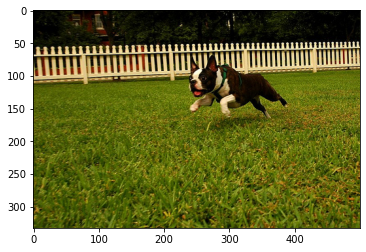

In [126]:
image_path = "flickr8k/Images/1009434119_febe49276a.jpg"
greedy_generated_caption(image_path, model, device)
beam_generated_captions(image_path, model, device)

Greedy generated caption
--------------------------------------------------
a man is climbing a rock wall . a . . . . . . . . .

Beam generated captions
--------------------------------------------------
a man is climbing a rock wall . a . . . . . . . . . . .
a man is climbing a a rock wall . a . . . . . . . . . .
a man is climbing . a rock wall . a . . . . . . . . . .
a man is climbing a a rock wall . . . . . . . . . . . .
a man is climbing a a rock wall . a a . . . . . . . . .


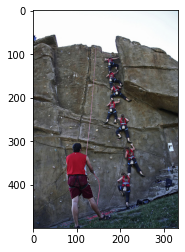

In [127]:
image_path = "flickr8k/Images/1016887272_03199f49c4.jpg"
greedy_generated_caption(image_path, model, device)
beam_generated_captions(image_path, model, device)

Greedy generated caption
--------------------------------------------------
a black dog is through the water . a tennis ball in its mouth . . . .

Beam generated captions
--------------------------------------------------
a black dog is through the water . the water . its mouth wide open . the water . .
a black dog is running through the water . a beach . its mouth . the water . . .
a black dog is running through the water . a beach . its mouth . . . . . .
a black dog is through the water . the water . its mouth wide open . the water . the
a black dog is running through the water . a beach . its mouth . the water . . the


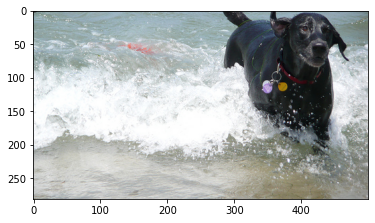

In [128]:
image_path = "flickr8k/Images/1022975728_75515238d8.jpg"
greedy_generated_caption(image_path, model, device)
beam_generated_captions(image_path, model, device)